<a href="https://colab.research.google.com/github/SuanTay/P3/blob/master/9_AnalyseVoila.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Analyse univariée

In [ ]:
import pandas as pd
import pandas.util.testing as tm
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno


In [ ]:
data = pd.read_csv('/content/drive/My Drive/Colab Notebooks/fr.openfoodfacts.org.products.csv/openfoodfacts.csv', sep='\t', low_memory=False)
df=data[['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g','nutriscore_score','nutriscore_grade']]


In [ ]:
df_eval=df[['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g']]

# Analyse bivariée

Text(0.5, 1.0, 'Analyse bivariée, pairplot')

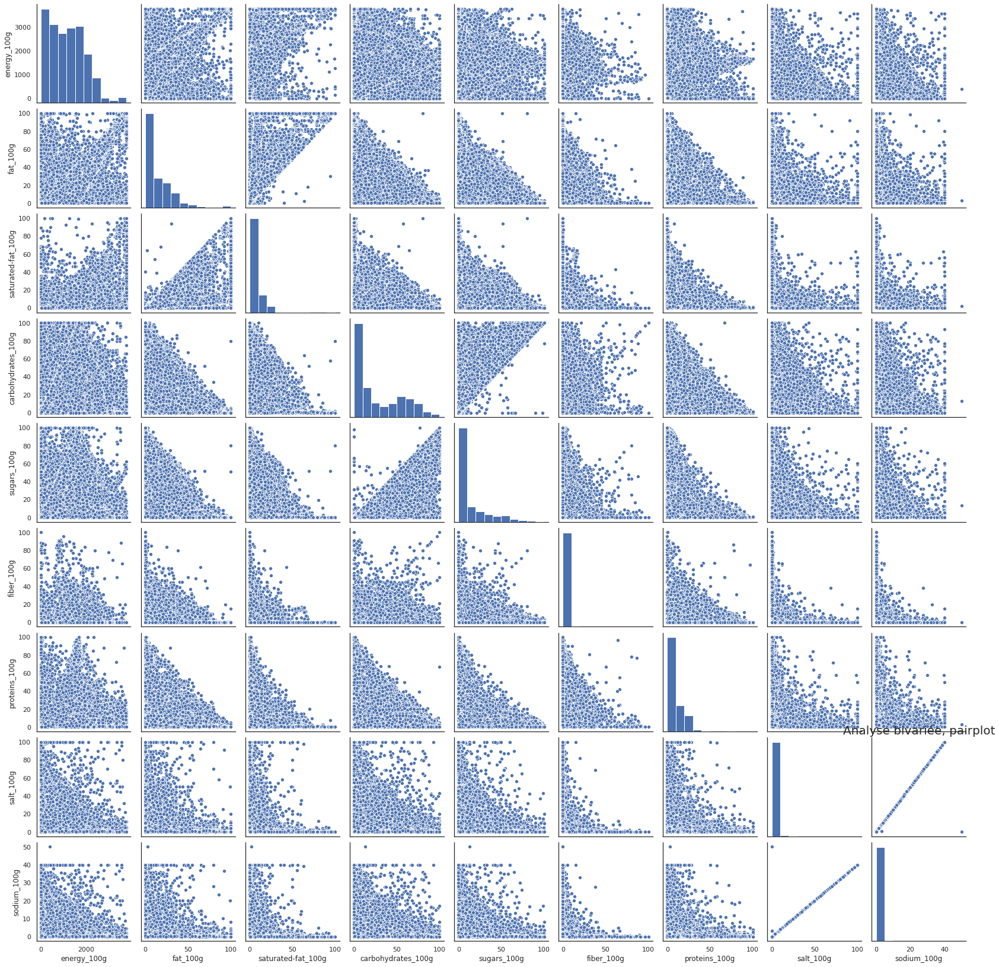

In [ ]:
sns.pairplot(df_eval)
plt.title("Analyse bivariée, pairplot", fontsize=20)

# Graphique de Corrélation

Text(0.5, 1.0, 'Heapmap de corrélation')

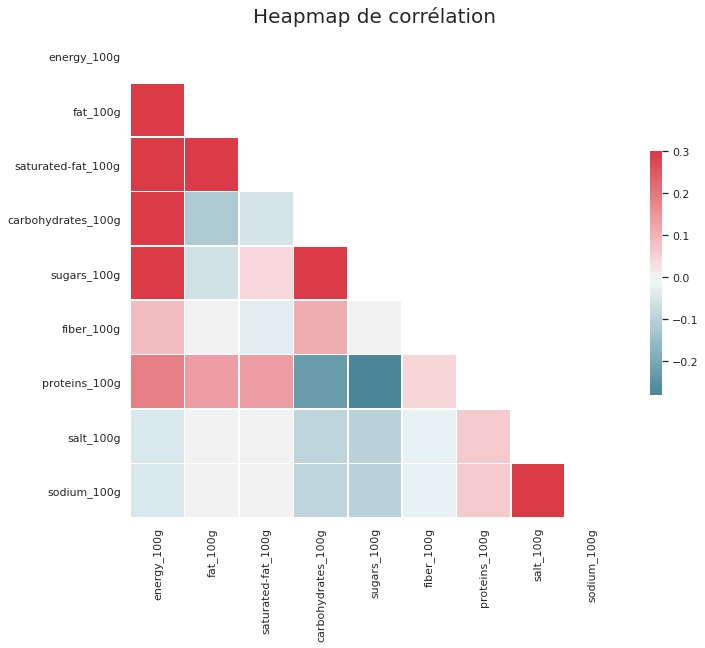

In [ ]:

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="white")

# Compute the correlation matrix
corr = df_eval.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.title("Heapmap de corrélation", fontsize=20)

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%pylab inline
pylab.rcParams['figure.figsize'] = (10, 6)

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.6/dist-packages/IPython/core/magics/pylab.py:161: UserWarning:

pylab import has clobbered these variables: ['f']
`%matplotlib` prevents importing * from pylab and numpy



## Sugar / energy

Text(0.5, 1.0, 'Sugar versus energy')

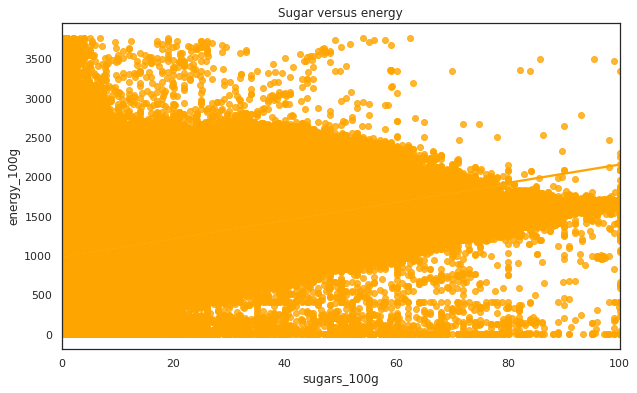

In [ ]:
sns.regplot(x = df_eval.sugars_100g, y = df_eval.energy_100g, data = df, color = 'Orange')
plt.title("Sugar versus energy")

## Quantité par catégories 

Text(0.5, 1.0, 'Quantité de produit par catégories')

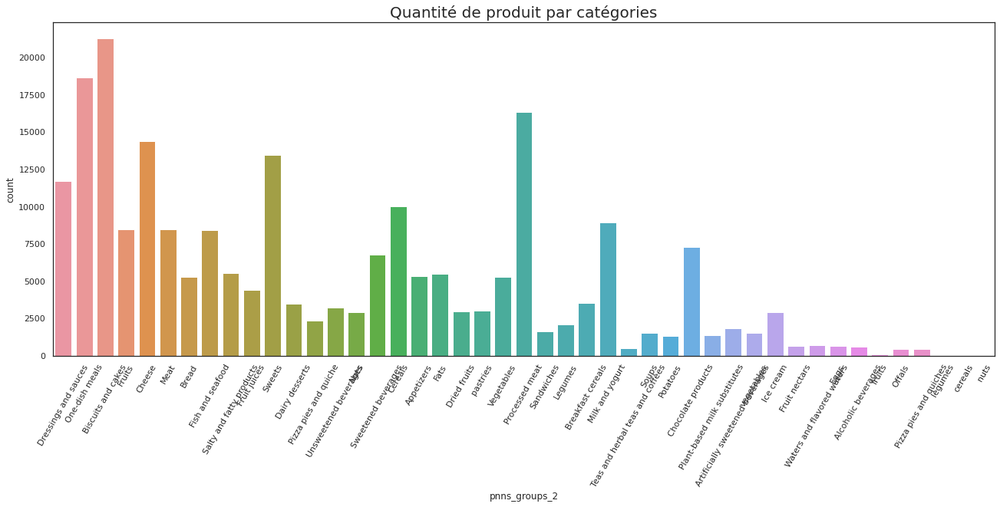

In [ ]:
plt.figure(figsize = (22, 8))
sns.countplot(x = 'pnns_groups_2', data = data[data.pnns_groups_2!='unknown'])
xt = plt.xticks(rotation=60)
plt.title("Quantité de produit par catégories", fontsize=20)

## Énergie vs Nutrie Grade

Text(0.5, 1.0, 'Violinplot énergie vs Nutrie Grade')

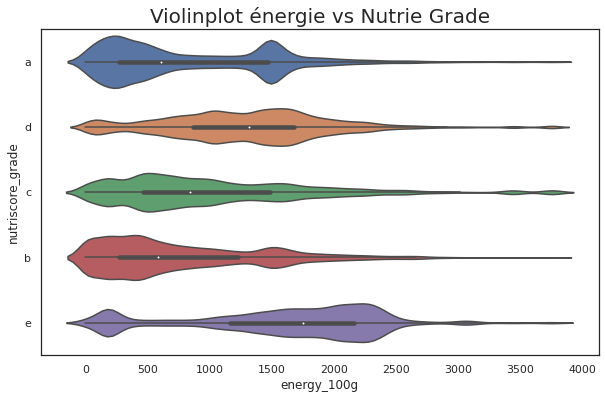

In [ ]:
sns.violinplot(df.energy_100g ,df.nutriscore_grade, data = df)
plt.title("Violinplot énergie vs Nutrie Grade", fontsize=20 )

# Energie, Fat et Fiber

In [ ]:
import plotly.graph_objects as go
import numpy as np


fig = go.Figure(data=[go.Mesh3d(x=df.energy_100g,
                   y=df.fat_100g,
                   z=df.fiber_100g,
                   opacity=0.5,
                   color='blue'
                  )])
fig.add_trace(
    go.Surface( colorscale='Viridis', showscale=False))

fig.update_layout(
    scene = dict(
        xaxis = dict(nticks=4, range=[0,100],),
        yaxis = dict(nticks=4, range=[0,100],),
        zaxis = dict(nticks=4, range=[0,100],),
        
        xaxis_title='Energ',
        yaxis_title='Fat',
        zaxis_title='Fiber'
        ),
        width=1500,
        margin=dict(r=20, l=10, b=10, t=10))


fig.show()